# Simulación DMPK

In [1]:
using LinearAlgebra

using Distributions
using Random

using Plots
using LaTeXStrings

using Interpolations
using QuadGK

## Subgrupos uniparamétricos

In [2]:
function n(x)
    return [1 - im*x/2  -im*x/2;
            im *x/2      1 + im*x/2]
end

function K(θ)
    return [exp(im*θ)  0;
            0      exp(-im*θ)]
end

function A(t)
    return [cosh(t)  sinh(t);
            sinh(t)  cosh(t)]
end

A (generic function with 1 method)

## Función para obtener la componente deseada de la matriz de transferencia

Para un cadena de $n$ deltas de Dirac se tiene 

$$
M=K(-ka_n)  \prod_{j=n}^1 N\left(\frac{\eta_j}{k}\right)K(kd_j)
$$

In [3]:
function ensemble(n_matrices::Int, n_samples::Int, component::Tuple{Int,Int}, distribution_x, distribution_θ)
    samples = ComplexF64[]

    for _ in 1:n_samples
        M = I(2)  
        θ_total = 0.0  
        for _ in 1:n_matrices
            x = rand(distribution_x)
            θ = rand(distribution_θ)
            θ_total += θ
            M *= n(x)*K(θ)
        end
        M = K(-θ_total) * M 

        push!(samples, M[component...])
    end
    return samples
end

ensemble (generic function with 1 method)

┌ Info: Saved animation to d:\willi\Documents\Documentos_HDD\TESIS_MAESTRIA\Tesis\DMPK\histograma_lambda_dmpk.gif
└ @ Plots C:\Users\willi\.julia\packages\Plots\Ec1L1\src\animation.jl:156


Plots.AnimatedGif("d:\\willi\\Documents\\Documentos_HDD\\TESIS_MAESTRIA\\Tesis\\DMPK\\histograma_lambda_dmpk.gif")
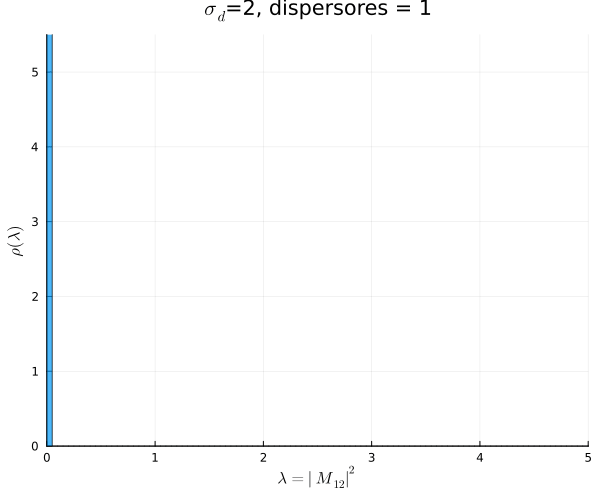

In [4]:
n_deltas = 200
σ_dmpk = 2
res = Vector{Vector{Float64}}(undef, n_deltas)

Threads.@threads for dispersores in 1:n_deltas 
    M_12_delta = ensemble(dispersores, 20000, (1,2), Normal(0.0, 0.1), Normal(2*π, σ_dmpk))# truncated(Normal(0,σ_dmpk), lower=0))
    lamb_delt = abs2.(M_12_delta)
    res[dispersores] = lamb_delt
end

#max_lambda = ceil(maximum(vcat(res...)))
bin_edges = range(0, 10, length=201)

anim_lamb_delta = @animate for dispersores in 1:n_deltas
    lamb_delt= res[dispersores]
    a1 = histogram(
        lamb_delt,
        bins=bin_edges,  
        normalize=:pdf,
        alpha=0.7,
        title="\$σ_d\$=$σ_dmpk, dispersores = $dispersores",
        xlabel=L"λ=|M_{12}|^{2}",
        ylabel=L"ρ(λ)",
        label=false,
        xlim=(0, 5),
        ylim=(0, 5.5)
    )

    plot(a1, size=(600,500))
end
gif(anim_lamb_delta, "histograma_lambda_dmpk.gif", fps=10)

## Solución numérica a la ecuación DMPK

### Método de Crank-Nicolson para la Ecuación DMPK
(Este método es incondicionalmente estable)

La ecuación DMPK es la ecuación que gobierna la evolución de la distribución de probabilidad para $\lambda$ 

$$
\frac{\partial P_s(\lambda)}{\partial s}=\frac{\partial P_s(\lambda)}{\partial \lambda}\left[\lambda(1+\lambda)\frac{\partial P_s(\lambda)}{\partial \lambda}\right]$$
 
 donde $s$ es la longitud adimensional del sistema

Si discretizamos $s$ El metodo C-N es 
$$
\frac{P^{n+1}-P^{n}}{\Delta s}=\frac{1}{2}\left[\mathcal{L}_\lambda P^{n+1}+\mathcal{L}_\lambda P^{n}\right]
$$

En donde $\mathcal{L}_\lambda$ se discretiza mediante diferencias finitas.

$$
\mathcal{L}_\lambda = \lambda(\lambda +1)\frac{\partial^2}{\partial \lambda^2}+(2\lambda+1)\frac{\partial}{\partial \lambda}
$$

Entonces con diferencias finitas centradas

$$
\frac{\partial P}{\partial \lambda} \approx \frac{P_{j+1} - P_{j-1}}{2\Delta \lambda}
$$

$$
\frac{\partial^2 P}{\partial \lambda^2} \approx \frac{P_{j+1} - 2P_{j} + P_{j-1}}{\Delta \lambda^2}
$$ 

Se tiene 

$$
AP^{n+1}=BP^n
$$

Tal que 

$$
AP^{n+1}=-\alpha[\lambda_j(\lambda_j+1)+\beta(2\lambda_j+1)]P_{j+1}^{n+1}+[1+2\alpha\lambda_j(\lambda_j+1)]P_j^{n+1}-\alpha[\lambda_j(\lambda_j+1)-\beta(2\lambda_j+1)]P_{j-1}^{n+1}
$$

$$
BP^{n}=\alpha[\lambda_j(\lambda_j+1)+\beta(2\lambda_j+1)]P_{j+1}^{n}+[1-2\alpha\lambda_j(\lambda_j+1)]P_j^{n}+\alpha[\lambda_j(\lambda_j+1)-\beta(2\lambda_j+1)]P_{j-1}^{n}
$$

Debido a que la ecuación DMPK es singular en el origen se impondrá una condición de frontera reflectante en $\lambda = 0$ es decir, integrando la ecuación

$$
\int_0^{\infty}\frac{\partial P}{\partial s}d\lambda=\int_0^{\infty}\frac{\partial }{\partial \lambda}\left[\lambda(\lambda+1)\frac{\partial P}{\partial \lambda}\right]d\lambda
$$

entonces por la regla de Leibniz y el teorema fundamental del cálculo

$$
\frac{\partial }{\partial s}\int_0^{\infty}Pd\lambda=\left[\lambda(\lambda+1)\frac{\partial P}{\partial \lambda}\right]_{\lambda\rightarrow 0^+}^{\lambda\rightarrow \infty}
$$

Y dado que $P_s(\lambda)$ es una distribución normalizada $\int_0^{\infty} P d\lambda=1$, se tiene

$$
0=\lim_{\lambda \rightarrow \infty} \left[\lambda(\lambda+1)\frac{\partial P}{\partial \lambda}\right]-\lim_{\lambda \rightarrow 0^+} \left[\lambda(\lambda+1)\frac{\partial P}{\partial \lambda}\right]
$$
Finalmente notese que si $\lambda \rightarrow \infty$ entonces $P_s(\lambda) \rightarrow 0$ y que cerca de cero $\lambda(\lambda+1)\approx\lambda$

Por lo tanto bastaría imponer condiciones de frontera tipo Neumann 
$$
\left.\frac{\partial P}{\partial \lambda}\right|_{\lambda=0}=0
$$


In [19]:
# Parámetros
λ_max = 10.0
n_points = 100000  # Menos puntos para mayor velocidad; más puntos para mayor resolución para calcular integral numerica
Δλ = λ_max / n_points
λ = range(0, λ_max, length=n_points)

Δt = 0.000236  # Paso temporal

# Datos para un instante
s_deseado = 0.09912
n_pasos = Int(round(s_deseado / Δt))

n_frames=200
pasos_por_frame = 10

t_max = n_frames * pasos_por_frame * Δt  # Tiempo de simulación
nt = Int(floor(t_max / Δt))

# Condición inicial: Distribución gaussiana muy estrecha
σ_b=0.001
ρ = 2*exp.(-λ.^2 / (2*σ_b^2))/ sqrt(2*π*σ_b^2)
# Funciones de difusión y deriva
D(λ_val) = λ_val * (1 + λ_val)
mu(λ_val) = 1 + 2*λ_val

Constant=Δt*pasos_por_frame

0.00236

In [ ]:
# Precalcula funciones de difusión y deriva
Dλ = λ .* (1 .+ λ)
muλ = 1 .+ 2 .* λ

# Condición inicial: Distribución gaussiana muy estrecha
σ_a=0.001
P = 2*exp.(-λ.^2 / (2*σ_a^2))/ sqrt(2*π*σ_a^2)

N = length(P)
α = Δt / (2 * Δλ^2)
β = Δλ / 2

# Prealoca arrays para tridiagonales
a = zeros(N-1)
b = zeros(N)
c = zeros(N-1)
aB = zeros(N-1)
bB = zeros(N)
cB = zeros(N-1)

von_neumann = true

for paso in 1:n_pasos
    # Construye tridiagonales solo una vez si Dλ y muλ no cambian
    for i in 2:N-1
        b[i] = 1 + α * 2 * Dλ[i]
        a[i-1] = -α * (Dλ[i] - β * muλ[i])
        c[i] = -α * (Dλ[i] + β * muλ[i])

        bB[i] = 1 - α * 2 * Dλ[i]
        aB[i-1] = α * (Dλ[i] - β * muλ[i])
        cB[i] = α * (Dλ[i] + β * muλ[i])
    end
    if von_neumann
        # Condiciones de frontera Von Neumann en λ=0
        b[1] = 1; c[1] = -1
        b[end] = 1; a[end-1] = 0#-1

        bB[1] = 0; cB[1] = 0
        bB[end] = 0; aB[end-1] = 0
    else
        # Condiciones de frontera Dirichlet 
        b[1] = 1; c[1] = 0
        b[end] = 1; a[end-1] = 0

        bB[1] = 0; cB[1] = 0
        bB[end] = 0; aB[end-1] = 0
    end

    # Matrices tridiagonales
    A_static = Tridiagonal(a, b, c)
    B_static = Tridiagonal(aB, bB, cB)

    # Resolver el sistema lineal
    P= A_static \ (B_static * P)
end

# Calcular el área bajo la curva usando la regla del trapecio
area = sum((P[1:end-1] .+ P[2:end]) .* diff(λ)) / 2
println("Área bajo la curva en s = $s_deseado: $area")
#Al integral numericamente, como la distribución esta muy concentrada en el cero, realizar la discretización del dominio
#mas fina cerca del cero da mayor resolución

Área bajo la curva en s = 0.09912: 0.9608473121644523


In [7]:
interp = LinearInterpolation(λ, P, extrapolation_bc=Line())
area, _ = quadgk(x -> interp(x), λ[1], λ[end])
println("Área bajo la curva para s = $s_deseado: $area")

Área bajo la curva para s = 0.09912: 0.9608473148949751


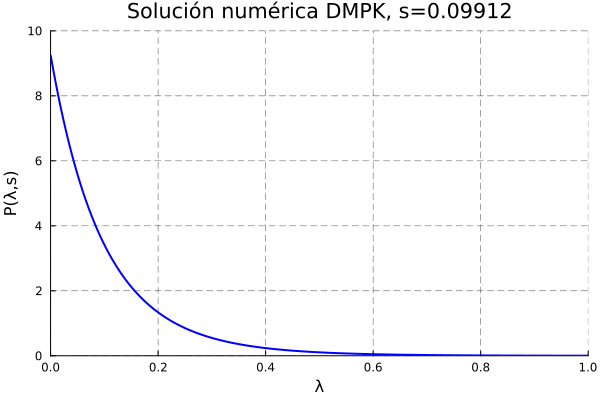

In [8]:
# Graficar la solución en el tiempo deseado von-neumann = false
plot(λ, P, 
     lw=2, 
     color=:blue, 
     xlims=(0, 1),
     ylims=(0, 10), 
     title="Solución numérica DMPK, s=$(round(s_deseado, digits=5))",
     xlabel="λ", 
     ylabel="P(λ,s)",
     legend=false,
     grid=true, 
     gridstyle=:dash, 
     gridalpha=0.7)

┌ Info: Saved animation to d:\willi\Documents\Documentos_HDD\TESIS_MAESTRIA\Tesis\DMPK\stable_dmpk_evolution_julia_fast.gif
└ @ Plots C:\Users\willi\.julia\packages\Plots\Ec1L1\src\animation.jl:156


Plots.AnimatedGif("d:\\willi\\Documents\\Documentos_HDD\\TESIS_MAESTRIA\\Tesis\\DMPK\\stable_dmpk_evolution_julia_fast.gif")
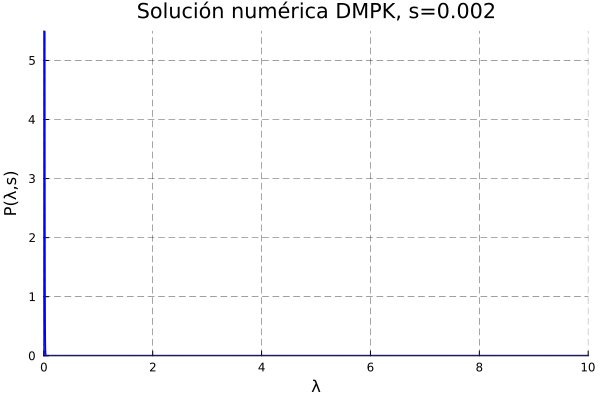

In [20]:
dmpk_solutions = Vector{Vector{Float64}}(undef, n_frames)

anim = @animate for frame in 1:n_frames
    global ρ

    dmpk_solutions[frame] = copy(ρ)
    # solución del sistema hasta s_deseado
    for _ in 1:pasos_por_frame
        α = Δt / (2 * Δλ^2)
        β = Δλ / 2
        
        N = length(ρ)
    
        # Vectores para las diagonales de A
        dl_A = zeros(N-1)  # diagonal inferior
        d_A = zeros(N)      # diagonal principal
        du_A = zeros(N-1)   # diagonal superior
    
        # Vectores para las diagonales de B
        dl_B = zeros(N-1)   # diagonal inferior
        d_B = zeros(N)      # diagonal principal
        du_B = zeros(N-1)   # diagonal superior
        
        # Llenar las diagonales para los puntos interiores
        for i in 2:N-1
            # Diagonal principal
            d_A[i] = 1 + α * 2 * D(λ[i])
            d_B[i] = 1 - α * 2 * D(λ[i])
            
            # Términos adyacentes (diagonales inferior y superior)
            dl_A[i-1] = -α * (D(λ[i]) - β * mu(λ[i]))
            du_A[i] = -α * (D(λ[i]) + β * mu(λ[i]))
            
            dl_B[i-1] = α * (D(λ[i]) - β * mu(λ[i]))
            du_B[i] = α * (D(λ[i]) + β * mu(λ[i]))
        end
        
        # Condiciones de frontera von-Neumann en λ=0 y Dirichlet en λ → ∞
        # Para la matriz A
        d_A[1] = 1; du_A[1] = -1 
        #en λ=0
        d_A[end] = 1; dl_A[end] = 0#-1
    
        # Para la matriz B (todos ceros en las fronteras)
        d_B[1] = 0; du_B[1] = 0 
        d_B[end] = 0; dl_B[end] = 0
    
        # Construir matrices tridiagonales
        A = Tridiagonal(dl_A, d_A, du_A)
        B = Tridiagonal(dl_B, d_B, du_B)

        # Resolver el sistema lineal
        ρ = A \ (B * ρ)
    end
    # Crear el plot
    tiempo = frame * pasos_por_frame * Δt
    plot(λ, ρ, 
         lw=2, 
         color=:blue, 
         xlims=(0, 10),
         ylims=(0, 5.5),
         #ylims=(0, 1.1*maximum(P)),
         title="Solución numérica DMPK, s=$(round(tiempo, digits=3))",
         xlabel="λ", 
         ylabel="P(λ,s)",
         legend=false,
         grid=true, 
         gridstyle=:dash, 
         gridalpha=0.7)
end

# Guardar la animación
gif(anim, "stable_dmpk_evolution_julia_fast.gif", fps=10)

┌ Info: Saved animation to d:\willi\Documents\Documentos_HDD\TESIS_MAESTRIA\Tesis\DMPK\animacion_histo_vs_dmpk.gif
└ @ Plots C:\Users\willi\.julia\packages\Plots\Ec1L1\src\animation.jl:156


Plots.AnimatedGif("d:\\willi\\Documents\\Documentos_HDD\\TESIS_MAESTRIA\\Tesis\\DMPK\\animacion_histo_vs_dmpk.gif")
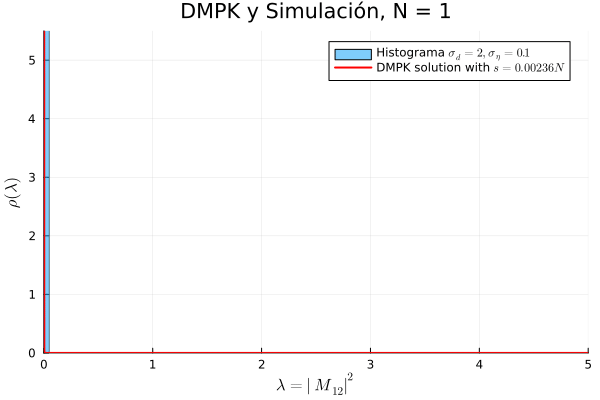

In [21]:
overlay_anim = @animate for frame in 1:length(dmpk_solutions)
    # Get DMPK solution
    P = dmpk_solutions[frame]
    # Get histogram data 
    lamb_delt = res[frame]
    
    # Plot histogram
    h = histogram(
        lamb_delt,
        bins=bin_edges,
        normalize=:pdf,
        alpha=0.5,
        label="Histograma \$σ_d=2, σ_η=0.1\$",
        xlim=(0, 5),
        ylim=(0, 5.5),
        xlabel=L"λ=|M_{12}|^{2}",
        ylabel=L"ρ(λ)",
        title="DMPK y Simulación, N = $frame"
    )
    # Overlay DMPK solution
    plot!(λ, P, lw=2, color=:red, label="DMPK solution with \$s=$Constant N\$")
end

gif(overlay_anim, "animacion_histo_vs_dmpk.gif", fps=10)

Si $s=0.00236 N$ siendo $N$ el numero de deltas entonces para $N=42$ se tiene $S=0.09912$

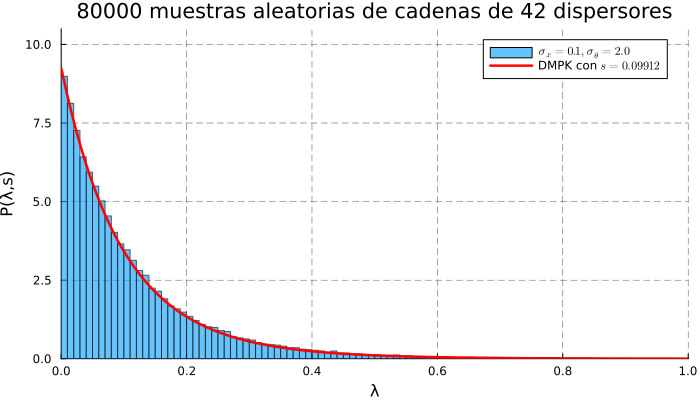

In [14]:
M_12_42 = ensemble(42, 80000, (1,2), Normal(0.0, 0.1), Normal(2*π, σ_dmpk))
lamb_42 = abs2.(M_12_42)

hist_42 = histogram(lamb_42, bins=200, normalize=:pdf, alpha=0.6, xlabel=L"y=ℑ[M_{12}]", ylabel=L"\rho(y)", label=L"σ_x=0.1, σ_θ=2.0")

# Plot
plt=plot(hist_42, size=(700, 400))
plot!(λ, P, lw=2.5, color=:red, xlims=(0, 1), ylims=(0, 10.5), xlabel="λ", ylabel="P(λ,s)", label="DMPK con \$s=0.09912\$", grid=true, gridstyle=:dash, gridalpha=0.7)

title!("80000 muestras aleatorias de cadenas de 42 dispersores")

In [ ]:
#savefig(plt,"DMPK_42_s_09912_v2")

"d:\\willi\\Documents\\Documentos_HDD\\CURSO DE PROGRAMACION MAESTRIA\\METODOS_COMPUTACIONALES_S_Y_N\\Metodos-Computacionales\\Tesis\\Pruebas\\DMPK_42_s_09912_v2.png"